In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-h96wintm
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-h96wintm
  Resolved https://github.com/facebookresearch/detectron2.git to commit 3c7bb714795edc7a96c9a1a6dd83663ecd293e36
  Preparing metadata (setup.py) ... done


In [3]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)


nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [4]:
# COMMON LIBRARIES
import os
import cv2

from datetime import datetime
from google.colab.patches import cv2_imshow

# DATA SET PREPARATION AND LOADING
from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog

# VISUALIZATION
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode

# CONFIGURATION
from detectron2 import model_zoo
from detectron2.config import get_cfg

# EVALUATION
from detectron2.engine import DefaultPredictor

# TRAINING
from detectron2.engine import DefaultTrainer

In [5]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="UrEOAU8AQfrZFuDouWoL")
project = rf.workspace("tabriz").project("late-blight-disease")
dataset = project.version(2).download("coco-segmentation")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Late-Blight-Disease-2 in coco-segmentation:: 100%|██████████| 1566/1566 [00:00<00:00, 2318.01it/s]


In [6]:
DATA_SET_NAME = dataset.name.replace(" ", "-")
ANNOTATIONS_FILE_NAME = "_annotations.coco.json"

In [7]:
# TRAIN SET
TRAIN_DATA_SET_NAME = f"{DATA_SET_NAME}-train"
TRAIN_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "train")
TRAIN_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "train", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TRAIN_DATA_SET_NAME, 
    metadata={}, 
    json_file=TRAIN_DATA_SET_ANN_FILE_PATH, 
    image_root=TRAIN_DATA_SET_IMAGES_DIR_PATH
)

# TEST SET
TEST_DATA_SET_NAME = f"{DATA_SET_NAME}-test"
TEST_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "test")
TEST_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "test", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=TEST_DATA_SET_NAME, 
    metadata={}, 
    json_file=TEST_DATA_SET_ANN_FILE_PATH, 
    image_root=TEST_DATA_SET_IMAGES_DIR_PATH
)

# VALID SET
VALID_DATA_SET_NAME = f"{DATA_SET_NAME}-valid"
VALID_DATA_SET_IMAGES_DIR_PATH = os.path.join(dataset.location, "valid")
VALID_DATA_SET_ANN_FILE_PATH = os.path.join(dataset.location, "valid", ANNOTATIONS_FILE_NAME)

register_coco_instances(
    name=VALID_DATA_SET_NAME, 
    metadata={}, 
    json_file=VALID_DATA_SET_ANN_FILE_PATH, 
    image_root=VALID_DATA_SET_IMAGES_DIR_PATH
)

In [8]:
[
    data_set
    for data_set
    in MetadataCatalog.list()
    if data_set.startswith(DATA_SET_NAME)
]

['Late-Blight-Disease-train',
 'Late-Blight-Disease-test',
 'Late-Blight-Disease-valid']

Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



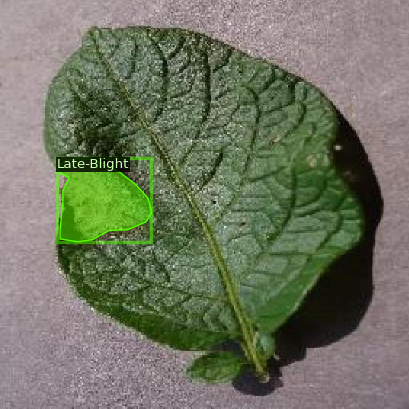

In [9]:
metadata = MetadataCatalog.get(TRAIN_DATA_SET_NAME)
dataset_train = DatasetCatalog.get(TRAIN_DATA_SET_NAME)

dataset_entry = dataset_train[1]
image = cv2.imread(dataset_entry["file_name"])

visualizer = Visualizer(
    image[:, :, ::-1],
    metadata=metadata, 
    scale=0.8, 
    instance_mode=ColorMode.IMAGE_BW
)

out = visualizer.draw_dataset_dict(dataset_entry)
cv2_imshow(out.get_image()[:, :, ::-1])

In [10]:
# HYPERPARAMETERS
Models=["mask_rcnn_R_50_FPN_3x",'mask_rcnn_R_101_FPN_3x'] 
ARCHITECTURE =Models[1]
CONFIG_FILE_PATH = f"COCO-InstanceSegmentation/{ARCHITECTURE}.yaml"
MAX_ITER = 4500
EVAL_PERIOD = 200
BASE_LR = 0.0025
NUM_CLASSES = 2

# OUTPUT DIR
OUTPUT_DIR_PATH = os.path.join(
    DATA_SET_NAME, 
    ARCHITECTURE, 
    datetime.now().strftime('%Y-%m-%d-%H-%M-%S')
)

os.makedirs(OUTPUT_DIR_PATH, exist_ok=True)

In [11]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(CONFIG_FILE_PATH))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(CONFIG_FILE_PATH)
cfg.DATASETS.TRAIN = (TRAIN_DATA_SET_NAME,)
cfg.DATASETS.TEST = (TEST_DATA_SET_NAME,)
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.TEST.EVAL_PERIOD = EVAL_PERIOD
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.INPUT.MASK_FORMAT='bitmask'
cfg.SOLVER.OPTIMIZER = "Adam" #"AdamW"
cfg.SOLVER.BASE_LR = BASE_LR
cfg.SOLVER.MAX_ITER = MAX_ITER
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES
cfg.OUTPUT_DIR = OUTPUT_DIR_PATH

In [12]:
# from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
# import detectron2.data.transforms as T
# from detectron2.data import DatasetMapper   # the default mapper

# dataloader = build_detection_train_loader(cfg,
#    mapper=DatasetMapper(cfg, is_train=True, augmentations=[
#       T.Resize((256, 256))
#    ]))

In [13]:
trainer = DefaultTrainer(cfg) 
# trainer.data_loader =dataloader
trainer.resume_or_load(resume=False)
trainer.train()

[05/27 13:02:14 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/27 13:02:15 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[05/27 13:02:25 d2.utils.events]:  eta: 0:32:29  iter: 19  total_loss: 2.725  loss_cls: 1.013  loss_box_reg: 0.7597  loss_mask: 0.6907  loss_rpn_cls: 0.2277  loss_rpn_loc: 0.0245    time: 0.4612  last_time: 0.4823  data_time: 0.0248  last_data_time: 0.0225   lr: 4.9952e-05  max_mem: 2475M
[05/27 13:02:44 d2.utils.events]:  eta: 0:36:15  iter: 39  total_loss: 2.02  loss_cls: 0.5358  loss_box_reg: 0.6959  loss_mask: 0.6676  loss_rpn_cls: 0.0696  loss_rpn_loc: 0.02023    time: 0.4959  last_time: 0.4592  data_time: 0.0241  last_data_time: 0.0159   lr: 9.9902e-05  max_mem: 2515M
[05/27 13:02:53 d2.utils.events]:  eta: 0:33:55  iter: 59  total_loss: 1.69  loss_cls: 0.3743  loss_box_reg: 0.6805  loss_mask: 0.5996  loss_rpn_cls: 0.01585  loss_rpn_loc: 0.008825    time: 0.4812  last_time: 0.4955  data_time: 0.0123  last_data_time: 0.0105   lr: 0.00014985  max_mem: 2515M
[05/27 13:03:02 d2.utils.events]:  eta: 0:33:26  iter: 79  total_loss: 1.734  loss_cls: 0.3804  loss_box_reg: 0.7986  loss_mas

In [14]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir $OUTPUT_DIR_PATH

<IPython.core.display.Javascript object>

In [15]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.6
predictor = DefaultPredictor(cfg)

[05/27 13:38:25 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from Late-Blight-Disease/mask_rcnn_R_101_FPN_3x/2023-05-27-13-02-12/model_final.pth ...


WARNING [05/27 13:38:25 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/27 13:38:25 d2.data.datasets.coco]: Loaded 87 images in COCO format from /content/Late-Blight-Disease-2/test/_annotations.coco.json


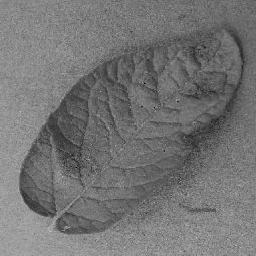

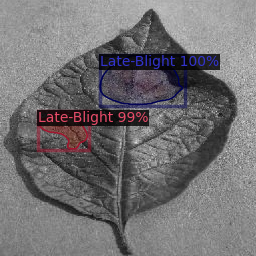

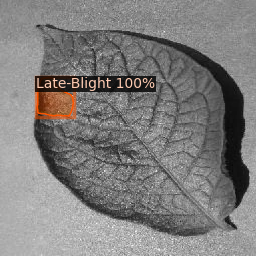

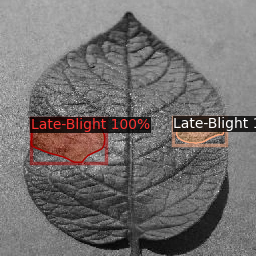

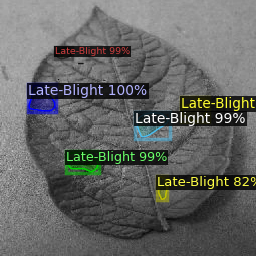

...

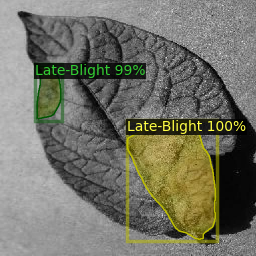

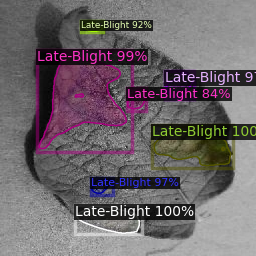

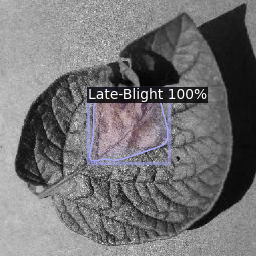

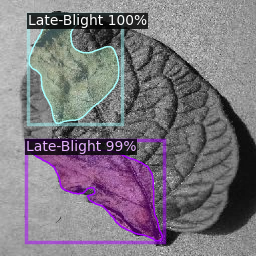

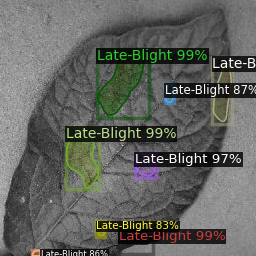

KeyboardInterrupt: ignored

In [16]:
dataset_valid = DatasetCatalog.get(TEST_DATA_SET_NAME )

for d in dataset_valid:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    
    visualizer = Visualizer(
        img[:, :, ::-1],
        metadata=metadata, 
        scale=.5, 
        instance_mode=ColorMode.IMAGE_BW
    )
  
    out = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
  
    cv2_imshow(out.get_image()[:, :, ::-1])

In [19]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader 

In [21]:
evaluator = COCOEvaluator(TRAIN_DATA_SET_NAME, cfg, False, output_dir="./TRAIN_output/")
val_loader = build_detection_test_loader(cfg, TRAIN_DATA_SET_NAME)
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/27 13:40:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/27 13:40:44 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/27 13:40:44 d2.data.datasets.coco]: Loaded 1288 images in COCO format from /content/Late-Blight-Disease-2/train/_annotations.coco.json
[05/27 13:40:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/27 13:40:44 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/27 13:40:44 d2.data.common]: Serializing 1288 elements to byte tensors and concatenating them all ...
[05/27 13:40:44 d2.data.common]: Serialized dataset takes 1.57 MiB
[05/27 13:40:44 d2.evaluation.evaluator]: Start inference on 1288 batches
[05/27 13

OrderedDict([('bbox',
              {'AP': 58.105396331609825,
               'AP50': 91.01533000350244,
               'AP75': 65.46984157666573,
               'APs': 29.13858321472822,
               'APm': 53.5782384392227,
               'APl': 74.67249124547511,
               'AP-Disease': nan,
               'AP-Late-Blight': 58.105396331609825}),
             ('segm',
              {'AP': 50.84027455051315,
               'AP50': 90.16530903633316,
               'AP75': 51.14925145837439,
               'APs': 19.544905439582127,
               'APm': 44.94247171754981,
               'APl': 69.7687988120848,
               'AP-Disease': nan,
               'AP-Late-Blight': 50.84027455051315})])

In [22]:
evaluator = COCOEvaluator(VALID_DATA_SET_NAME, cfg, False, output_dir="./VALID_output/")
val_loader = build_detection_test_loader(cfg, VALID_DATA_SET_NAME)
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/27 13:43:13 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/27 13:43:13 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/27 13:43:13 d2.data.datasets.coco]: Loaded 183 images in COCO format from /content/Late-Blight-Disease-2/valid/_annotations.coco.json
[05/27 13:43:13 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/27 13:43:13 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/27 13:43:13 d2.data.common]: Serializing 183 elements to byte tensors and concatenating them all ...
[05/27 13:43:13 d2.data.common]: Serialized dataset takes 0.24 MiB
[05/27 13:43:13 d2.evaluation.evaluator]: Start inference on 183 batches
[05/27 13:43

OrderedDict([('bbox',
              {'AP': 40.42125196946002,
               'AP50': 74.1264119003208,
               'AP75': 40.78453762592059,
               'APs': 11.956570324092539,
               'APm': 34.8002517589482,
               'APl': 60.365903857887325,
               'AP-Disease': nan,
               'AP-Late-Blight': 40.42125196946002}),
             ('segm',
              {'AP': 38.26022647929649,
               'AP50': 74.10917654600811,
               'AP75': 34.176383971854925,
               'APs': 6.102122694612811,
               'APm': 30.1556839219359,
               'APl': 62.513680025231224,
               'AP-Disease': nan,
               'AP-Late-Blight': 38.26022647929649})])